<a href="https://colab.research.google.com/github/DharaniSureshBabu/Berry_CS639.github.io/blob/main/cranberry_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Install Detectron2

In [ ]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

In [1]:
from pathlib import Path
from google.colab import drive
import os
import shutil

drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
!cp "/content/drive/MyDrive/cranberry.marsh.zip" data.zip
!unzip data.zip

In [3]:
from detectron2.data.datasets import register_coco_instances
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
import datetime as dt

register_coco_instances("train",
                        {},
                        "cranberry.marsh/train/annotations.json",
                        "cranberry.marsh/train/")

# register_coco_instances("valid",
#                         {},
#                         "cranberry.d8/valid/annotations.json",
#                         "cranberry.d8/valid/")

register_coco_instances("test",
                        {},
                        "cranberry.marsh/test/annotations.json",
                        "cranberry.marsh/test/")

# MetadataCatalog.get("train").set(thing_classes=["cranberry", None])
#MetadataCatalog.get("test").set(thing_classes=["cranberry",])
#MetadataCatalog.get("valid").set(thing_classes=["cranberry",])
metadata = MetadataCatalog.get("train")
dataset_dicts = DatasetCatalog.get("train")


WARNING [12/13 00:51:06 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/13 00:51:06 d2.data.datasets.coco]: Loaded 106 images in COCO format from cranberry.marsh/train/annotations.json


In [5]:
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
from detectron2.utils.logger import log_every_n_seconds
from detectron2.data import DatasetMapper, build_detection_test_loader
import detectron2.utils.comm as comm
from detectron2.engine import DefaultTrainer
import torch
import logging
import time
import datetime

class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)



class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
                     
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1,LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks


In [6]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg = get_cfg()

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output/")

# Model
# model_name = 'mask_rcnn_R_101_FPN_3x.yaml'
# COCO-Detection
# model_name = 'mask_rcnn_X_101_32x8d_FPN_3x.yaml'
model_name = 'faster_rcnn_R_101_FPN_3x.yaml'
# cfg.merge_from_file(model_zoo.get_config_file(f"COCO-InstanceSegmentation/{model_name}"))
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(f"COCO-InstanceSegmentation/{model_name}")
cfg.merge_from_file(model_zoo.get_config_file(f"COCO-Detection/{model_name}"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(f"COCO-Detection/{model_name}")

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 # 256 # 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
# cfg.MODEL.RESNETS.DEPTH = 101  # default is 50
# cfg.MODEL.RESNETS.DEPTH = 101
cfg.MODEL.MASK_ON = False
# cfg.MODEL.MASK_ON = False
cfg.MODEL.BACKBONE.FREEZE_AT = 2 # 4  # default = 2

cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.INPUT.MIN_SIZE_TRAIN = (50,)
cfg.INPUT.MAX_SIZE_TRAIN  = 1024*3
cfg.INPUT.MIN_SIZE_TEST = 50
cfg.INPUT.MAX_SIZE_TEST  = 1024

# Solver
cfg.SOLVER.IMS_PER_BATCH = 16 # 72 # 96 # 24  # 4 # 12  # 4
cfg.SOLVER.STEPS = (2500, 7500, 10000, 15000, 20000, 25000) # (20, 10000, 20000)
cfg.SOLVER.BASE_LR = 0.02 # 0.075 # 0.002 # 0.025
cfg.SOLVER.MAX_ITER = 40000

cfg.TEST.EVAL_PERIOD = 2750
cfg.TEST.DETECTIONS_PER_IM = 2500

# New 
# cfg.SOLVER.GAMMA = 0.5

cfg.OUTPUT_DIR = '/content/drive/MyDrive/cranberry-coco-detectron-' + str(dt.datetime.now()).replace(' ', '')
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# save config
with open (f"{cfg.OUTPUT_DIR}/training.yaml", "w") as f:
  f.write(cfg.dump())

print(cfg.OUTPUT_DIR, '\n')

WARNING [12/13 01:19:10 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
/content/drive/MyDrive/cranberry-coco-detectron-2021-12-1301:19:10.415992 



In [ ]:
# Run training loop
trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/13 01:20:33 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:12, 19.0MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[12/13 01:22:30 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/13 01:22:37 d2.utils.events]:  eta: 3:52:05  iter: 19  total_loss: 3.049  loss_cls: 0.5339  loss_box_reg: 0.03071  loss_rpn_cls: 0.8854  loss_rpn_loc: 1.477  time: 0.3395  data_time: 0.1740  lr: 0.00039962  max_mem: 1826M
[12/13 01:22:44 d2.utils.events]:  eta: 3:49:25  iter: 39  total_loss: 1.272  loss_cls: 0.3587  loss_box_reg: 0.05285  loss_rpn_cls: 0.4094  loss_rpn_loc: 0.4975  time: 0.3407  data_time: 0.1543  lr: 0.00079922  max_mem: 1826M
[12/13 01:22:51 d2.utils.events]:  eta: 3:49:46  iter: 59  total_loss: 1.079  loss_cls: 0.3217  loss_box_reg: 0.06869  loss_rpn_cls: 0.294  loss_rpn_loc: 0.3838  time: 0.3434  data_time: 0.1567  lr: 0.0011988  max_mem: 1826M
[12/13 01:22:58 d2.utils.events]:  eta: 3:49:39  iter: 79  total_loss: 1.022  loss_cls: 0.3095  loss_box_reg: 0.07366  loss_rpn_cls: 0.2504  loss_rpn_loc: 0.3593  time: 0.3483  data_time: 0.1716  lr: 0.0015984  max_mem: 1826M
[12/13 01:23:05 d2.utils.events]:  eta: 3:48:50  iter: 99  total_loss: 0.9854  loss_cls: 0.2933 

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("valid", )
cfg.INPUT.MIN_SIZE_TEST = 50
cfg.INPUT.MAX_SIZE_TEST  = 1024*2
predictor = DefaultPredictor(cfg)



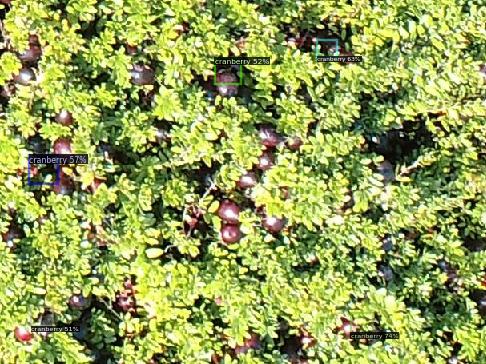

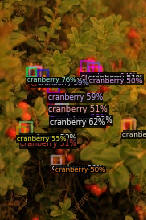

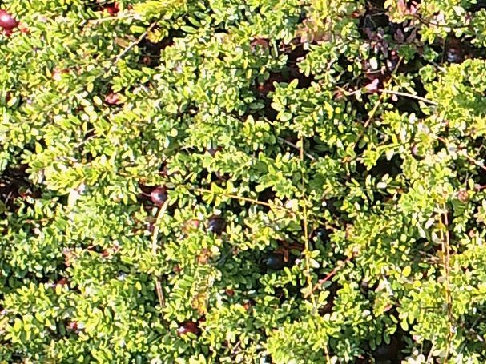

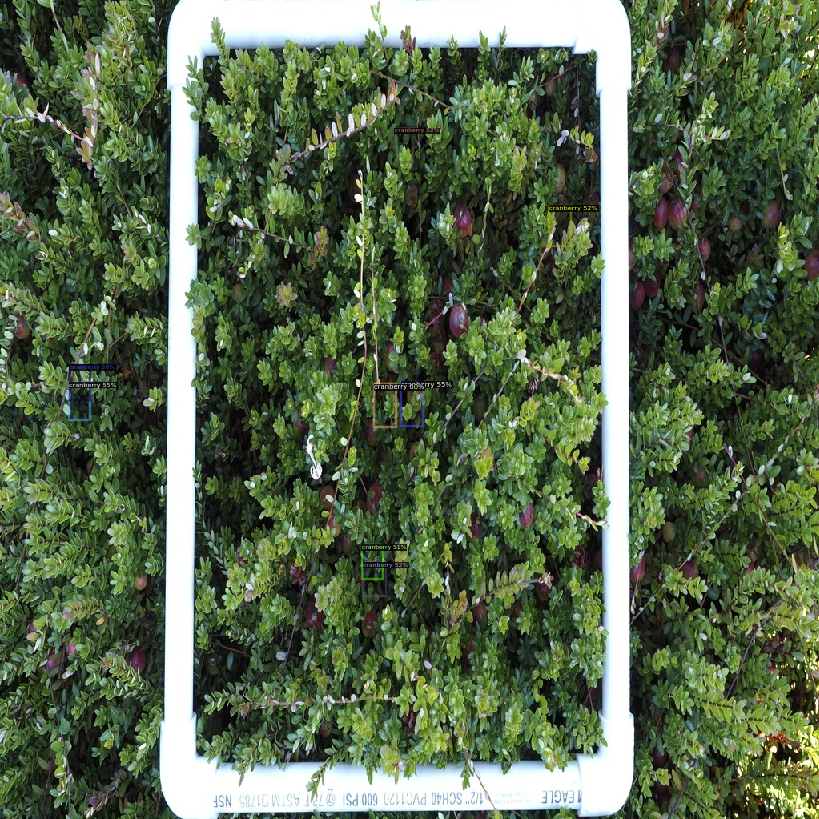

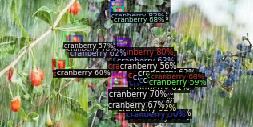

...

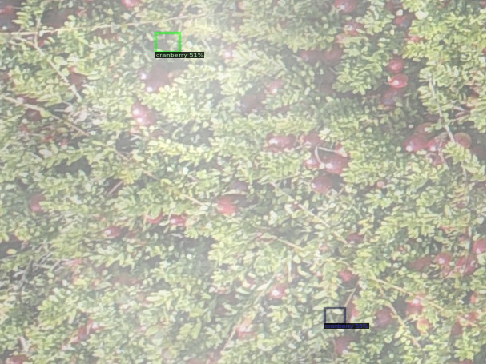

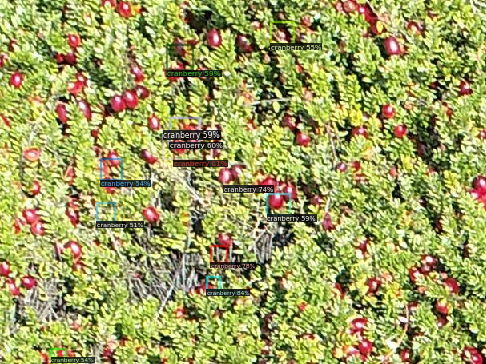

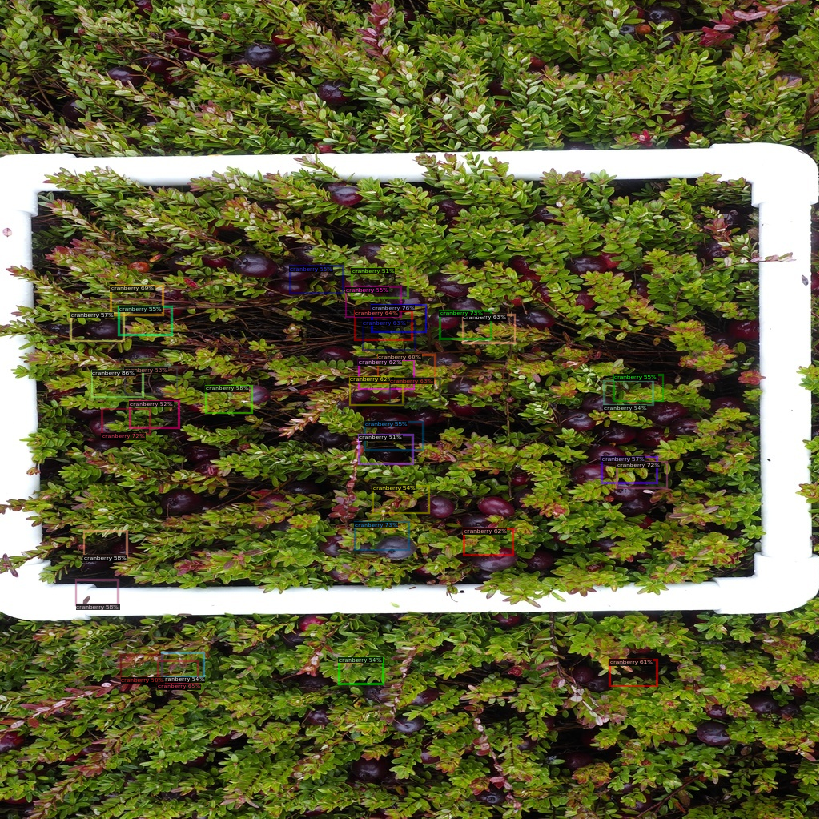

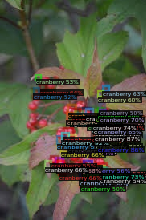

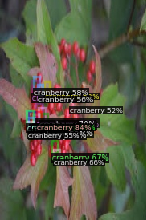

In [ ]:
from detectron2.utils.visualizer import ColorMode
import random


# metadata = MetadataCatalog.get("train")
# dataset_dicts = DatasetCatalog.get("train")

for d in random.sample(dataset_dicts, 25):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata, 
                   scale=0.8, 
                  # instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0024999.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("train", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "train")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [11/16 03:59:51 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/16 03:59:51 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/16 03:59:51 d2.data.datasets.coco]: Loaded 994 images in COCO format from cranberry-berrynet/train/_annotations.coco.json
[11/16 03:59:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(50, 50), max_size=1024, sample_style='choice')]
[11/16 03:59:51 d2.data.common]: Serializing 994 elements to byte tensors and concatenating them all ...
[11/16 03:59:51 d2.data.common]: Serialized dataset takes 1.05 MiB
[11/16 03:59:51 d2.evaluation.evaluator]: Start inference on 994 batches


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[11/16 03:59:52 d2.evaluation.evaluator]: Inference done 11/994. Dataloading: 0.0007 s/iter. Inference: 0.0425 s/iter. Eval: 0.0003 s/iter. Total: 0.0435 s/iter. ETA=0:00:42
[11/16 03:59:57 d2.evaluation.evaluator]: Inference done 129/994. Dataloading: 0.0012 s/iter. Inference: 0.0413 s/iter. Eval: 0.0002 s/iter. Total: 0.0427 s/iter. ETA=0:00:36
[11/16 04:00:02 d2.evaluation.evaluator]: Inference done 246/994. Dataloading: 0.0012 s/iter. Inference: 0.0413 s/iter. Eval: 0.0002 s/iter. Total: 0.0428 s/iter. ETA=0:00:31
[11/16 04:00:07 d2.evaluation.evaluator]: Inference done 364/994. Dataloading: 0.0012 s/iter. Inference: 0.0412 s/iter. Eval: 0.0002 s/iter. Total: 0.0427 s/iter. ETA=0:00:26
[11/16 04:00:12 d2.evaluation.evaluator]: Inference done 479/994. Dataloading: 0.0012 s/iter. Inference: 0.0414 s/iter. Eval: 0.0002 s/iter. Total: 0.0429 s/iter. ETA=0:00:22
[11/16 04:00:17 d2.evaluation.evaluator]: Inference done 591/994. Dataloading: 0.0012 s/iter. Inference: 0.0417 s/iter. Eval: 

OrderedDict([('bbox',
              {'AP': 2.990506904450914,
               'AP50': 6.527891774103792,
               'AP75': 2.311103423869568,
               'APl': 59.77243907767893,
               'APm': 7.040651113245697,
               'APs': 0.07811208524682384})])